# Neural Net - Testing Our Model on EuroSat Imagery

In [10]:
import sys
sys.path.insert(1,'../')
from raster_data import RasterData
import rasterio
from tqdm import tqdm, trange
from model_architecture import ResNet50, ResNet101, Net, ResNet151
import torch
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
plt.rcParams.update({'figure.max_open_warning': 0})
from display import __normalize_array as norm
import numpy as np
import math
from display import __normalize_array
import warnings
warnings.filterwarnings("ignore")

## Converting jp2 to numpy array

In [11]:
def get_numpy_array(image):
    img = rasterio.open(image)
    final_image = np.zeros([*img.shape, 3]).astype(np.uint16)
    final_image[:,:,0] = img.read(1)
    final_image[:,:,1] = img.read(2)
    final_image[:,:,2] = img.read(3)

    return final_image

## Useful Methods For Data Creation

### Images taken from https://www.esa.int/ESA_Multimedia/Search?SearchText=Sentinel-2+&result_type=images

In [12]:
def get_remainder_shape(y,x,z):
    y -= y % 64
    x -= x % 64
    return y,x
            
def get_64_based_image(arr):
    y, x = get_remainder_shape(*arr.shape)
    return arr[:y, :x, :]

def get_blocks(arr):
    arr = get_64_based_image(arr)
    img_shape = arr.shape
    tile_size = (64, 64)
    offset = (64, 64)
    ll = []
    for i in range(int(math.ceil(img_shape[0]/(offset[1] * 1.0)))):
        for j in range(int(math.ceil(img_shape[1]/(offset[0] * 1.0)))):
            ll.append((arr[offset[1]*i:min(offset[1]*i+tile_size[1],
                                                       img_shape[0]), 
                                       offset[0]*j:min(offset[0]*j+tile_size[0], 
                                                       img_shape[1])]))

    return np.array(ll)
    
def get_net_input(arr):
    in_data = get_blocks(arr)
    in_data = np.swapaxes(in_data, 1,3)
    in_data = np.swapaxes(in_data, 2,3)
    return in_data

def normalize_image(arr):
    arr = arr - arr.mean()
    std = np.std(arr)
    return (arr/std)

In [13]:
correspondance = {
    'AnnualCrop': 'wheat',
    'Forest': 'darkgreen',
    'HerbaceousVegetation': 'green',
    'Highway': 'grey',
    'Industrial': 'darkgrey',
    'Pasture': 'lightgreen',
    'PermanentCrop': 'orange',
    'Residential': 'yellow',
    'River': 'lightblue',
    'Sealake': 'darkblue'
}

developped = {
    'AnnualCrop': 'wheat',
    'Forest': 'green',
    'HerbaceousVegetation': 'green',
    'Highway': 'grey',
    'Industrial': 'darkgrey',
    'Pasture': 'lightgreen',
    'PermanentCrop': 'orange',
    'Residential': 'yellow',
    'River': 'blue',
    'Sealake': 'blue'
}



classes = correspondance.keys()
custom_cmap = ListedColormap(correspondance.values())

# Loading Our Neural Net

In [14]:
device = torch.device('cpu')
model = ResNet50().to(device)
model.load_state_dict(torch.load('../../models/resnet.pt', map_location=device))
model = model.float()

In [15]:
def get_predicitons(in_data):
    in_data = torch.from_numpy(in_data).float()
    output = []
    model.eval()
    chunk_size = 500
    max_size = in_data.shape[0]
    with torch.no_grad():
        for i in trange(int(max_size / chunk_size + 1), desc='Chunk'):
            output.append(model(in_data[i*chunk_size:(i+1)*chunk_size,:]).
                          argmax(1).tolist())

    return output

In [16]:
def plot_result(output, org_shape):
    y, x = get_remainder_shape(*org_shape)
    flat_list = [item for sublist in output for item in sublist]
    square = np.array(flat_list).reshape(int(y/64), int(x/64))
    finished = square.repeat(64, axis=0).repeat(64, axis=1)
    plt.figure(figsize=(15,15))
    plt.imshow(finished, cmap=custom_cmap)

# Montreal, Canada

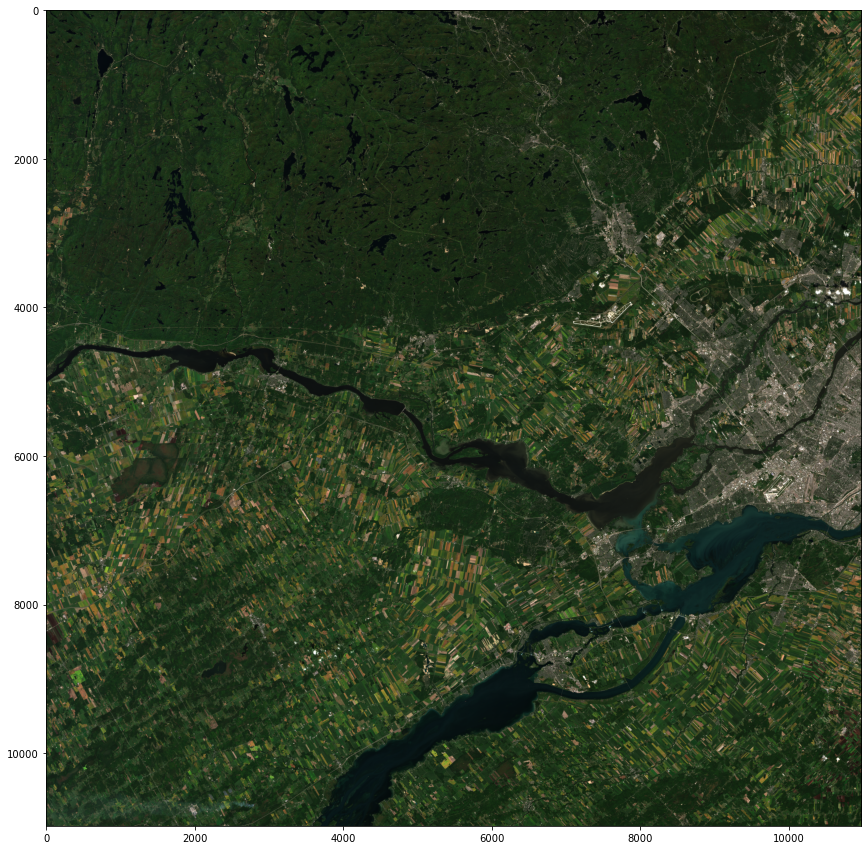

In [58]:
rgb_path = '../../images/montreal.jp2'
img = get_numpy_array(rgb_path)
org_shape = img.shape
plt.figure(figsize=(15,15))
plt.imshow(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


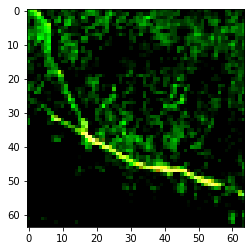

In [46]:
input_data = get_net_input(normalize_image(img))

Chunk: 100%|██████████| 59/59 [02:02<00:00,  2.08s/it]


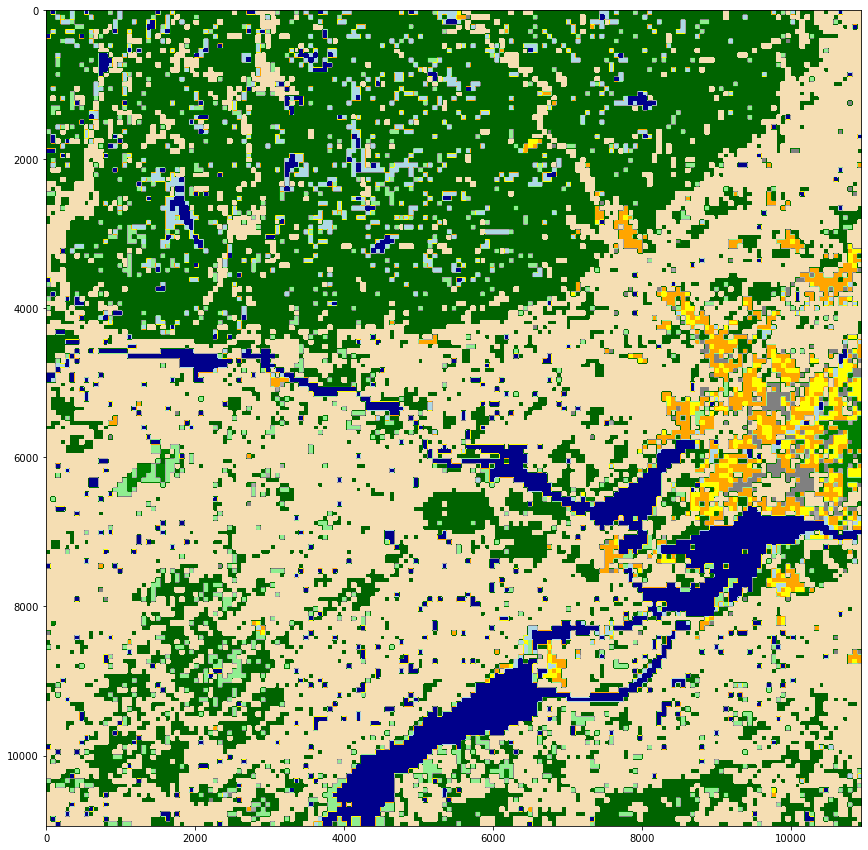

In [47]:
pred = get_predicitons(input_data)
plot_result(pred, org_shape)

# Venice, Italy

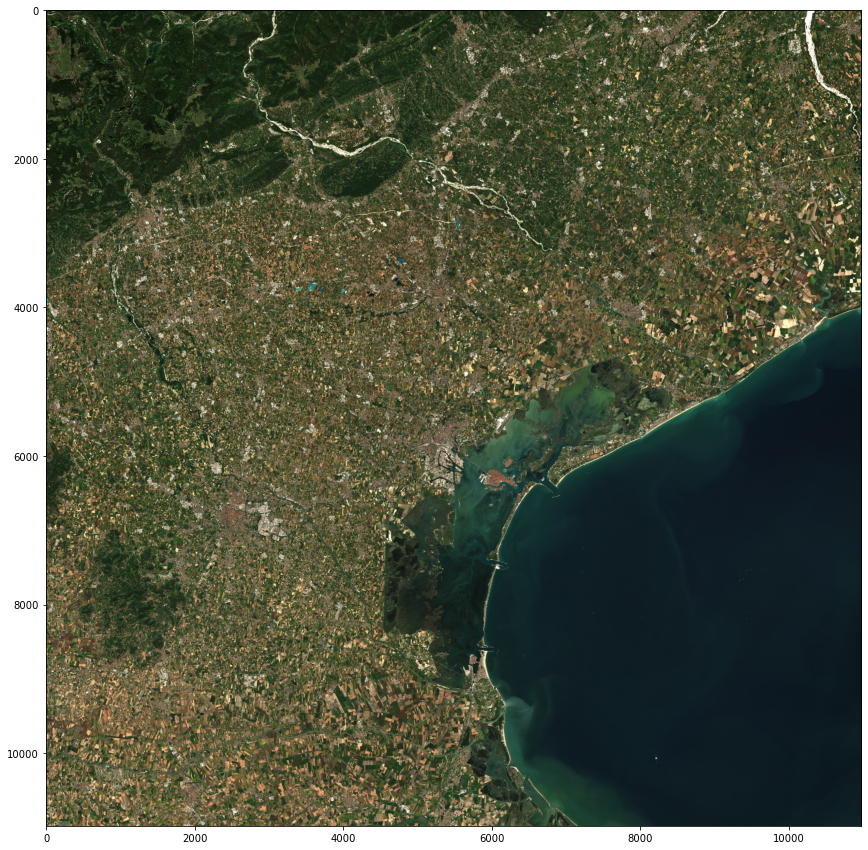

In [8]:
rgb_path = '../../images/venice.jp2'
img = get_numpy_array(rgb_path)
org_shape = img.shape
plt.figure(figsize=(15,15))
plt.imshow(img)

Chunk: 100%|██████████| 59/59 [02:03<00:00,  2.09s/it]


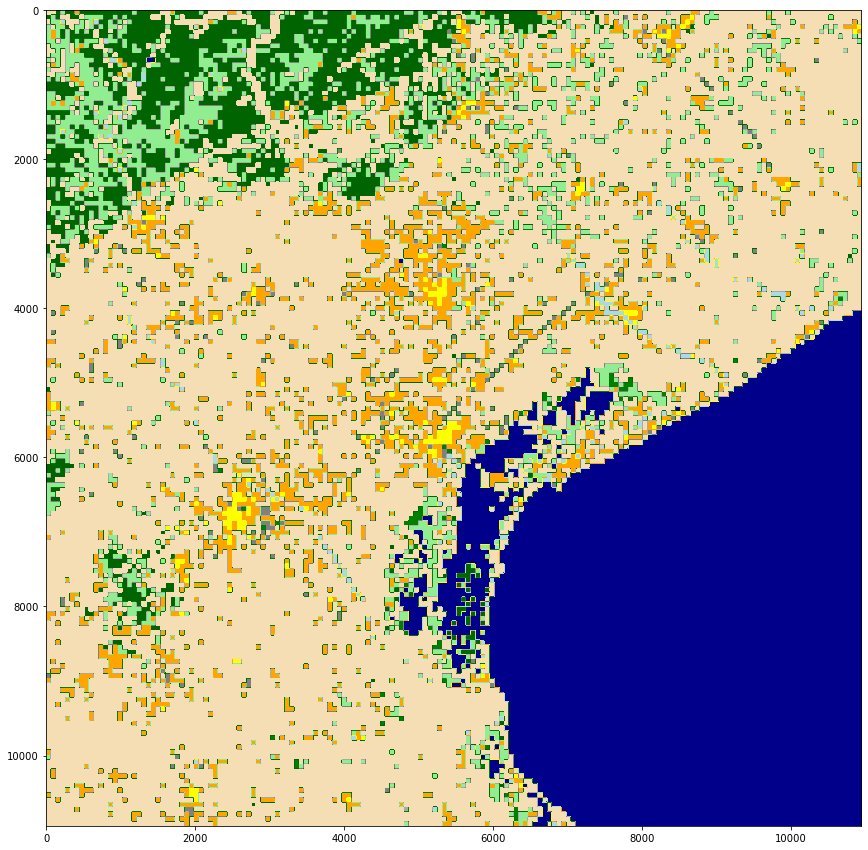

In [17]:
input_data = get_net_input(normalize_image(img))
pred = get_predicitons(input_data)
plot_result(pred, org_shape)

# Darmstadt, Germany

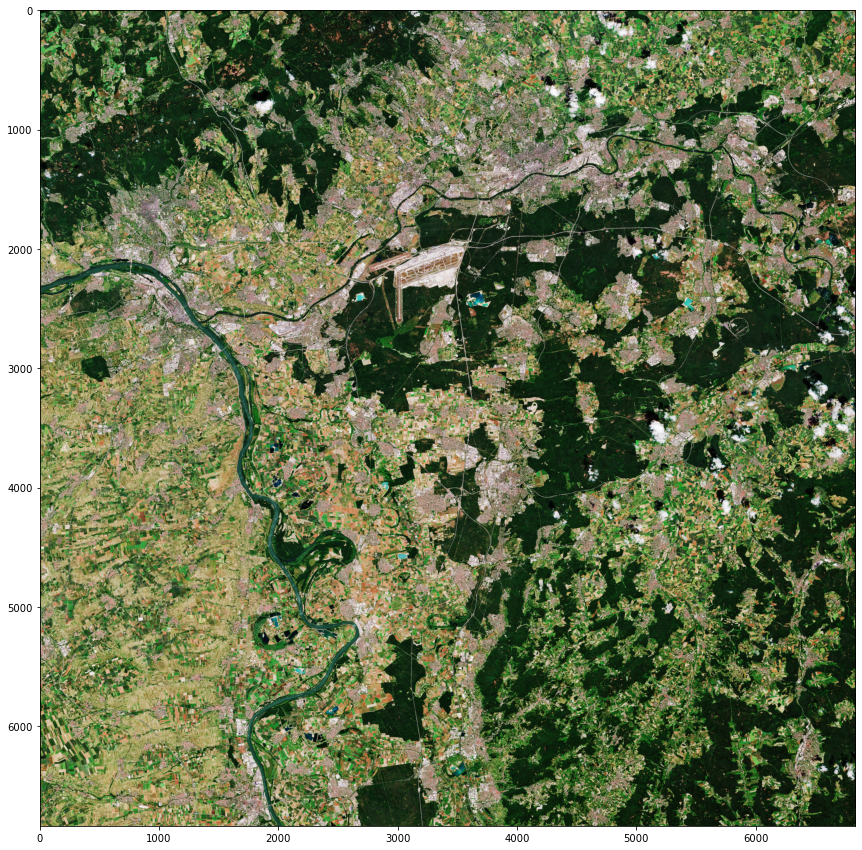

In [10]:
rgb_path = '../../images/Darmstadt_S2_20200623_ER.tif'
germany = plt.imread(rgb_path)
org_shape = germany.shape
plt.figure(figsize=(15,15))
plt.imshow(germany)

In [11]:
input_data = get_net_input(normalize_image(germany))
plt.imshow(input_data[0].T)

Chunk: 100%|██████████| 23/23 [00:47<00:00,  2.08s/it]


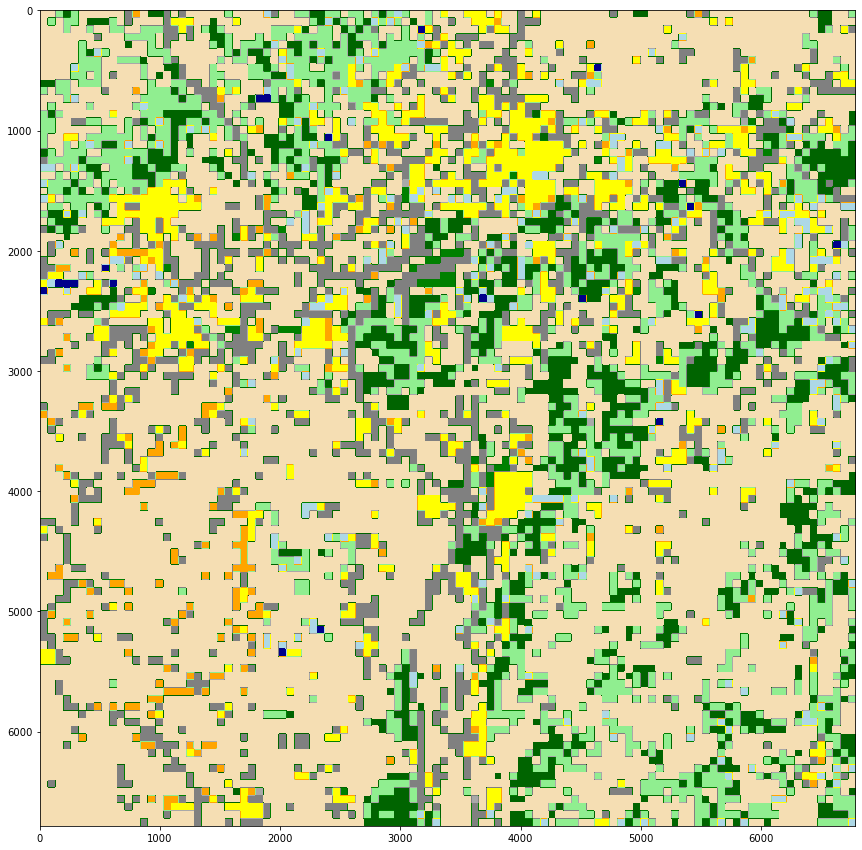

In [13]:
pred = get_predicitons(input_data)
plot_result(pred, org_shape)

# Zeeland, Netherlands

/home/alex/anaconda3/envs/sat/lib/python3.7/site-packages/PIL/Image.py:2837: DecompressionBombWarning: Image size (106998336 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


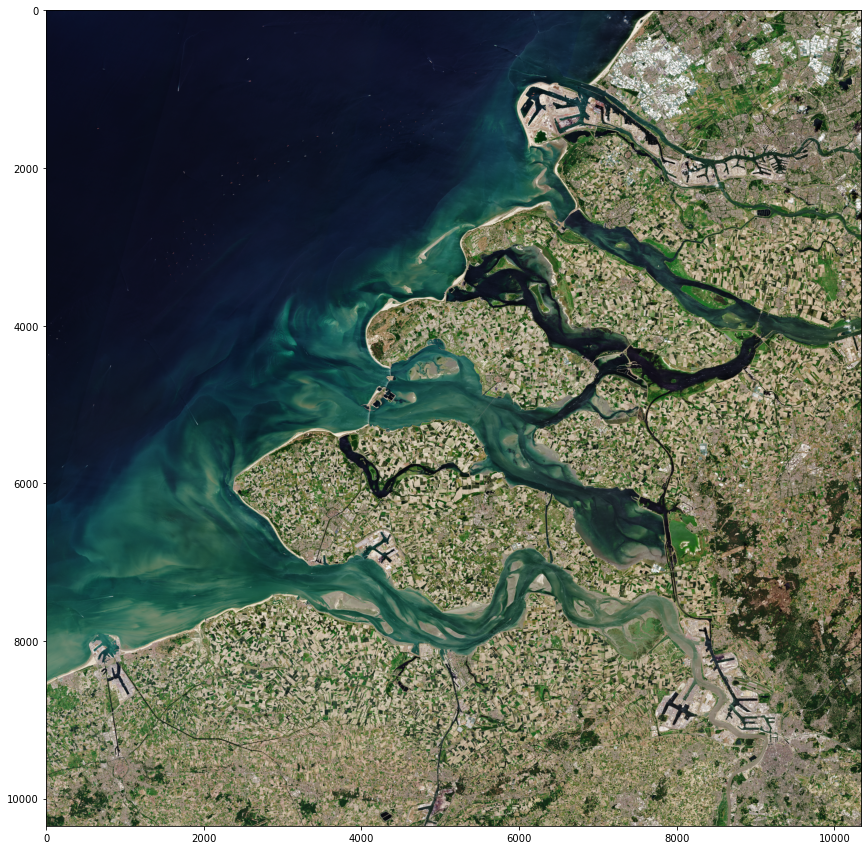

In [18]:
rgb_path = '../../SampleImages/Zeeland_S2_20200530_ER.tif'
netherlands = plt.imread(rgb_path)
org_shape = netherlands.shape
plt.figure(figsize=(15,15))
plt.imshow(netherlands)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


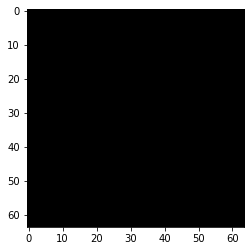

In [20]:
input_data = get_net_input(normalize_image(netherlands))

Chunk: 100%|██████████| 52/52 [01:57<00:00,  2.25s/it]


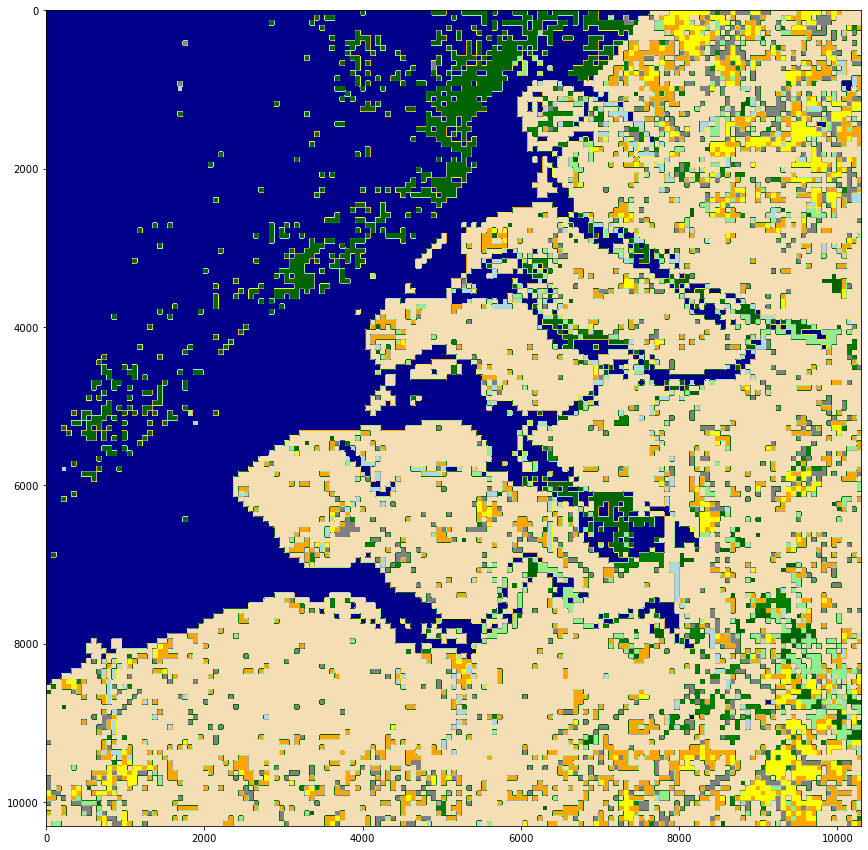

In [21]:
pred = get_predicitons(input_data)
plot_result(pred, org_shape)

# Gulf of Taranto, Italy

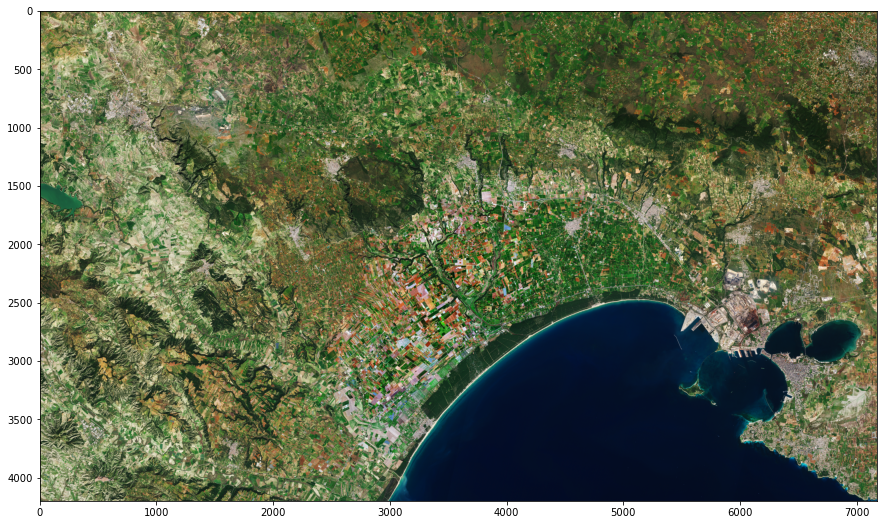

In [22]:
rgb_path = '../../SampleImages/Matera_S2A_MSIL1C_06March2019_432_MM_IOW.tif'
matera = plt.imread(rgb_path)
org_shape = matera.shape
plt.figure(figsize=(15,15))
plt.imshow(matera)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


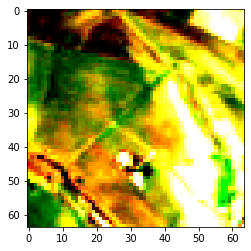

In [24]:
input_data = get_net_input(normalize_image(matera))
plt.imshow(input_data[0].T)

Chunk: 100%|██████████| 15/15 [00:32<00:00,  2.16s/it]


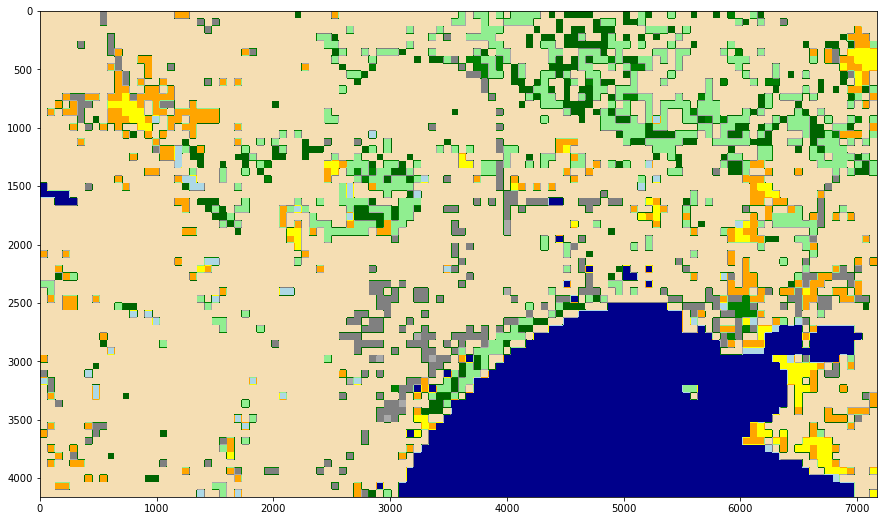

In [25]:
pred = get_predicitons(input_data)
plot_result(pred, org_shape)

# San Francisco, California

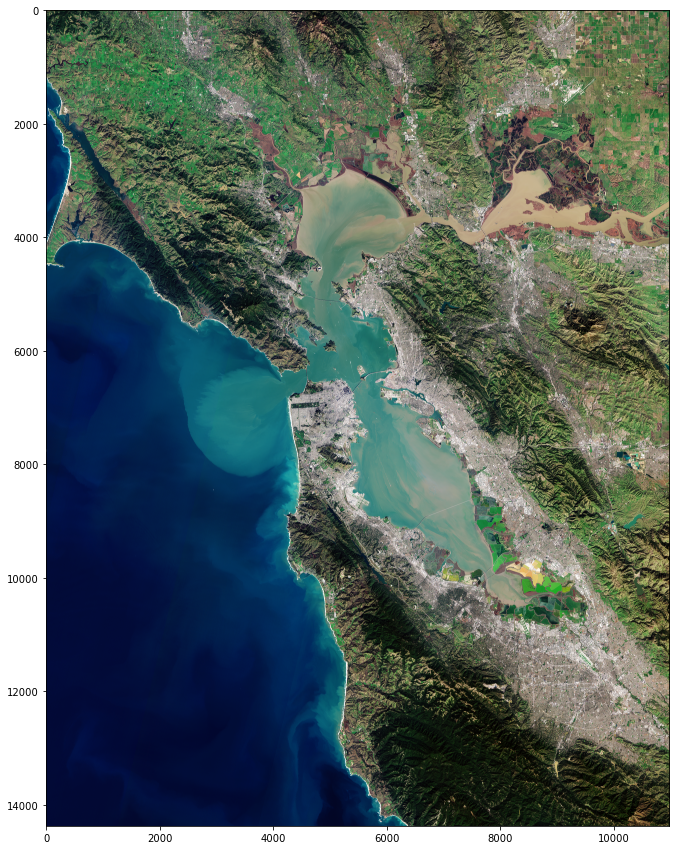

In [29]:
rgb_path = '/home/alex/Downloads/San_Fransisco_S2A_20190125_mosaic_ER.tif'
sanfran = plt.imread(rgb_path)
org_shape = sanfran.shape
plt.figure(figsize=(15,15))
plt.imshow(sanfran);

Chunk: 100%|██████████| 77/77 [02:51<00:00,  2.22s/it]


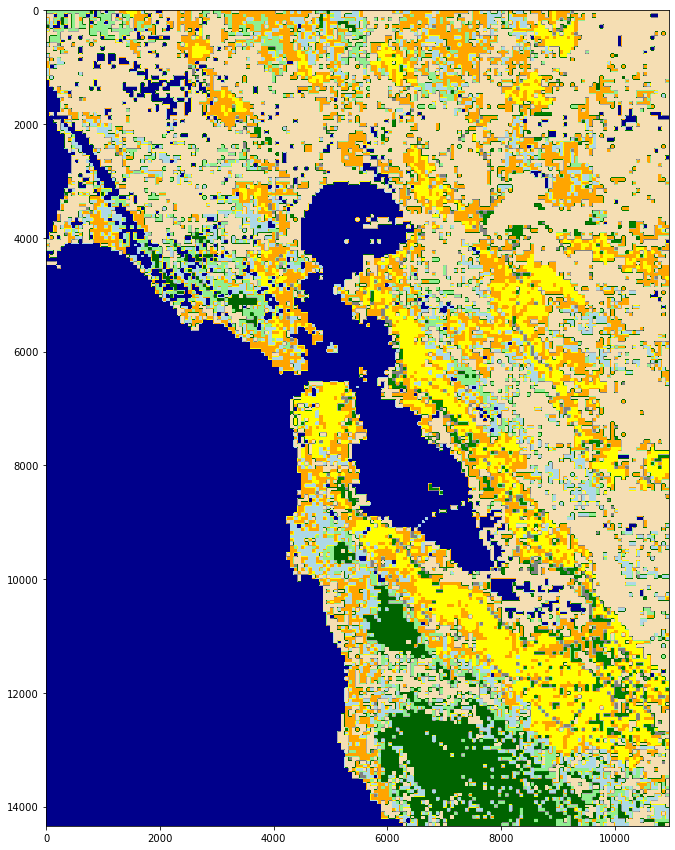

In [30]:
input_data = get_net_input(normalize_image(sanfran))
pred = get_predicitons(input_data)
plot_result(pred, org_shape)